# Image Deconvolution with Tikhonov Regularisation

In this project, our aim is to use Tikhonov regularisations' techniques, more specifically L2 and H1 regularisations, in order to re-obtain an image without noise.

Our aim is to apply different kind of Blur to the image, then adding noise and finally trying to `DEBLUR` the image with different techniques

In [1]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

We import the image we want to test and show it. Plotting its shape and pixel values (min, max and mean)

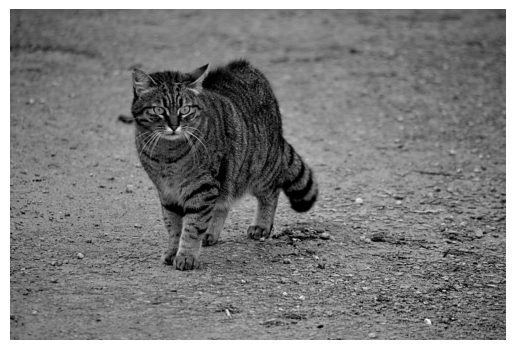

In [2]:
# Load image
image = np.array(Image.open('/content/cat.jpg!d').convert('L'))
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()

In [3]:
print(f"image shape: {image.shape}")
print(f"Min pixel value: {image.min()}")
print(f"Max pixel value: {image.max()}")
print(f"Mean pixel value: {image.mean()}")

image shape: (800, 1200)
Min pixel value: 0
Max pixel value: 255
Mean pixel value: 113.537209375


We procede by normalizing the image

In [4]:
# Normalize image
image = image / 255
print(f"Min pixel value: {image.min()}")
print(f"Max pixel value: {image.max()}")
print(f"Mean pixel value: {image.mean()}")

Min pixel value: 0.0
Max pixel value: 1.0
Mean pixel value: 0.44524395833333336


We can now define and apply the blur function. First, we convert the functions to the frequency domain by applying the Fourier transform; by doing this, we will be able to apply the gaussian blur (kernel) to the image, using a simple moltiplication. This can be done thanks to the fact that Fourier Transform diagonalizes the Convolution.

`Blur` is deterministic, meaning it can be modeled with a clear mathematical function. Blur can arise for different reasons, in this case, Gaussian blur can, for example, be found when looking at an image with a microscope.

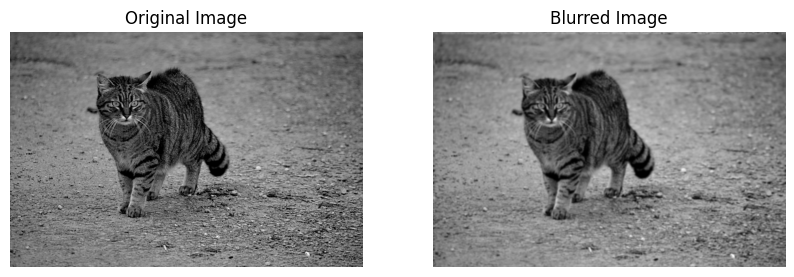

In [5]:
def fourier_gaussian_blur(image, kernel_size=15):
    # Convert image to float32 (for better precision)
    image = np.float32(image)

    # Get image size
    h, w = image.shape

    # Create a Gaussian blur kernel in spatial domain
    kernel = cv2.getGaussianKernel(kernel_size, 2)  # Sigma ~= 3
    kernel = np.outer(kernel, kernel)

    # Pad kernel to image size
    pad_h = h - kernel.shape[0]
    pad_w = w - kernel.shape[1]
    kernel_padded = np.pad(kernel, [(0, pad_h), (0, pad_w)], mode='constant')

    # Compute Fourier transforms of image and kernel
    image_fft = np.fft.fft2(image)
    kernel_fft = np.fft.fft2(kernel_padded)

    # Perform element-wise multiplication
    blurred_fft = image_fft * kernel_fft

    # Inverse Fourier transform to get back to spatial domain
    blurred_image = np.fft.ifft2(blurred_fft).real

    # clip to 0-1
    blurred_image = np.clip(blurred_image, 0, 1)
    return blurred_image

# Apply the blur function on the padded image
image_blur = fourier_gaussian_blur(image, kernel_size=15)

# Show the results
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Blurred Image")
plt.imshow(image_blur, cmap='gray')
plt.axis('off')
plt.show()

We procede by adding noise to the image, plotting the result and pixel values to check correctness.

Differently from blur, `Noise` is stochastic and cannot be modeled. In fact it is what makes the deconvolution problem difficult.
Noise arises during the recording of the image.

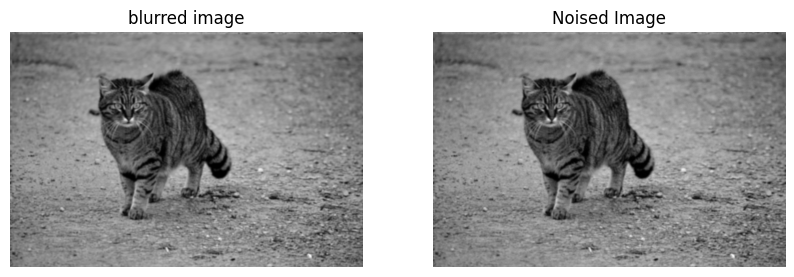

In [6]:
gaussian_noise = np.random.normal(0, 0.01, image_blur.shape)
image_noise = np.clip(image_blur + gaussian_noise, 0, 1)


# Show the results
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("blurred image")
plt.imshow(image_blur, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Noised Image")
plt.imshow(image_noise, cmap='gray')
plt.axis('off')
plt.show()

In [7]:
print(f"Min pixel value: {image_noise.min()}")
print(f"Max pixel value: {image_noise.max()}")
print(f"Mean pixel value: {image_noise.mean()}")

Min pixel value: 0.0
Max pixel value: 0.906108377953543
Mean pixel value: 0.4452319394117284


Once the image is blurred, we can define the firs deconvolution function, based on the minimization of Loss L2:

min(f) ∥Af−g∥2+µ∥f∥2

The µ parameter is a regularization parameter, which is necessary since, without, reconstruction of f could diverge.
Many other problems could arise withouth regularization, but we will not discuss them.

Before doing that, we show the fourier transform:

(-0.5, 1199.5, 799.5, -0.5)

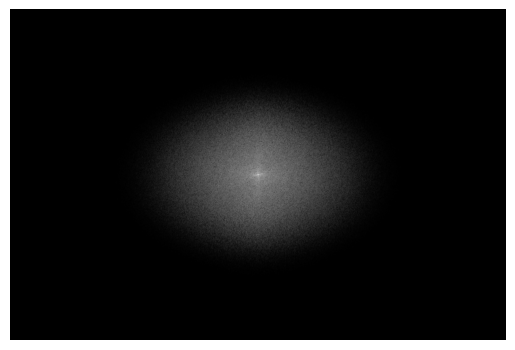

In [21]:
from scipy.fftpack import fftshift

G = np.fft.fft2(image_blur)
G = fftshift(np.abs(G))
plt.imshow(np.log1p(G), cmap='gray')
plt.axis("off")

As we can see, frequency has a peak in the center of the image (where the cat lies) and spreads around, exactly as we expect from a gaussian function.

In [9]:
def L2_deconvolution(blurred, kernel, mu):

    # Convert image to float32 for precision
    blurred = np.float32(blurred)

    # Get image size
    h, w = blurred.shape

    # Pad kernel to image size
    pad_h, pad_w = h - kernel.shape[0], w - kernel.shape[1]
    kernel_padded = np.pad(kernel, [(0, pad_h), (0, pad_w)], mode='constant')

    # Compute Fourier transforms
    G = np.fft.fft2(blurred)
    K = np.fft.fft2(kernel_padded)

    # Wiener deconvolution
    K_conj = np.conj(K)  # Compute complex conjugate
    F_hat = (G * K_conj) / (K*K_conj + mu)  # Apply Wiener filter

    # Inverse Fourier transform to get restored image
    restored = np.fft.ifft2(F_hat).real

    restored = np.clip(restored, 0, 1)

    return restored


Now we can show the deconvolution result for different µ values, also providing a PSNR score, which gives a comparison between pixel values of the real and reconstructed imege.

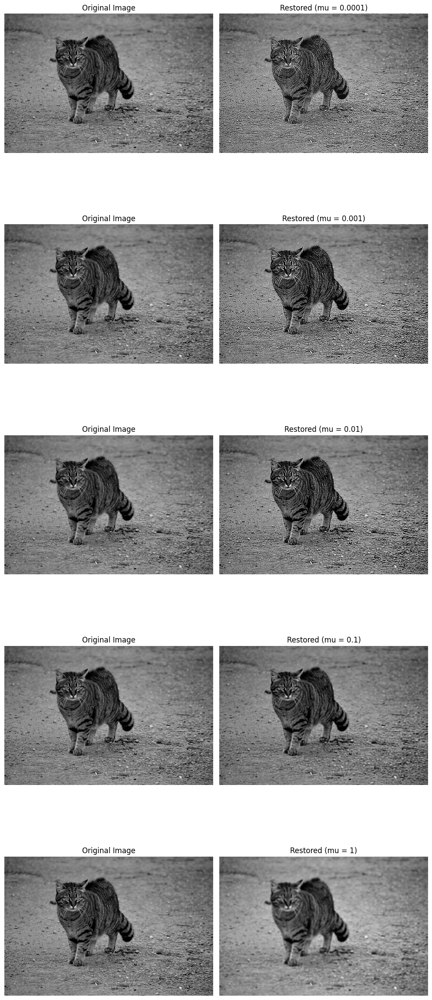

In [10]:
kernel = cv2.getGaussianKernel(15, 3)
kernel = kernel @ kernel.T  # Convert to 2D Gaussian kernel
mu_values = [0.0001, 0.001, 0.01, 0.1, 1]
restored_images = {}

# Create a figure and axes for plotting
fig, axes = plt.subplots(len(mu_values), 2, figsize=(10, 5 * len(mu_values)))

# Iterate over mu values and perform deconvolution
for i, mu in enumerate(mu_values):
    # Apply Wiener deconvolution
    image_restored = L2_deconvolution(image_noise, kernel, mu)
    restored_images[mu] = image_restored

    # Display the original and restored images
    axes[i, 0].imshow(image, cmap='gray')
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(image_restored, cmap='gray')
    axes[i, 1].set_title(f"Restored (mu = {mu})")
    axes[i, 1].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

Define a PSNR function, it Calculates the Peak Signal-to-Noise Ratio (PSNR) between two images; Value is in decibels (db).

In [11]:
def calculate_psnr(img1, img2):
    """
    Args:
      img1: Original image.
      img2: Reconstructed or distorted image.

    """
    mse = np.mean((img1 - img2) ** 2)
    max_pixel = 1

    if mse == 0:
        return float('inf')
    else:
        return 20 * np.log10(max_pixel / np.sqrt(mse))

In [12]:
# Calculate PSNR
best_restored_image = None
best_psnr = -float('inf')

for mu, restored_image in restored_images.items():
    psnr_value = calculate_psnr(image, restored_image)
    if psnr_value > best_psnr:
      best_psnr = psnr_value
      best_restored_image = restored_image
      best_mu = mu
    print(f"PSNR for mu={mu}: {psnr_value:.2f} dB")

PSNR for mu=0.0001: 13.07 dB
PSNR for mu=0.001: 19.11 dB
PSNR for mu=0.01: 23.73 dB
PSNR for mu=0.1: 22.45 dB
PSNR for mu=1: 12.27 dB


We continue by trying a different kind of deconvolution, in this case the H1:

min(f) ∥Af−g∥2+µ∥f∥2+∥∇f∥2

In this kind of regularization, we also add a gradient parameter, which should lead us to smooth high frequency jumps, and preserve small details.

In [13]:
def H1_deconvolution(blurred, kernel, mu):

    # Convert image to float32 for precision
    blurred = np.float32(blurred)

    # Get image size
    h, w = blurred.shape

    # Pad kernel to the size of the image to avoid boundary issues
    pad_h, pad_w = h - kernel.shape[0], w - kernel.shape[1]
    kernel_padded = np.pad(kernel, [(0, pad_h), (0, pad_w)], mode='constant')

    # Compute Fourier transforms of both the blurred image and the padded kernel
    G = np.fft.fft2(blurred)
    K = np.fft.fft2(kernel_padded)

    # Compute the gradient penalty term in the Fourier domain
    # The gradient in Fourier domain is a multiplication by frequency components
    freq_x = np.fft.fftfreq(w)
    freq_y = np.fft.fftfreq(h)
    fx, fy = np.meshgrid(freq_x, freq_y)

    # Regularization term (1 + |omega_1|^2 + |omega_2|^2)
    freq_term = (2 * np.pi * fx) ** 2 + (2 * np.pi * fy) ** 2
    regularization_term = mu * (1 + freq_term)

    # Wiener deconvolution with regularization
    K_conj = np.conj(K)  # Compute complex conjugate of kernel
    F_hat = (G * K_conj) / (np.abs(K) ** 2 + regularization_term)  # Apply Wiener filter with H1 regularization

    # Inverse Fourier transform to get restored image in the spatial domain
    restored = np.fft.ifft2(F_hat).real

    # Normalize the result to 0-1
    restored = np.clip(restored, 0, 1)

    return restored

As before we compute the result for different values of µ:

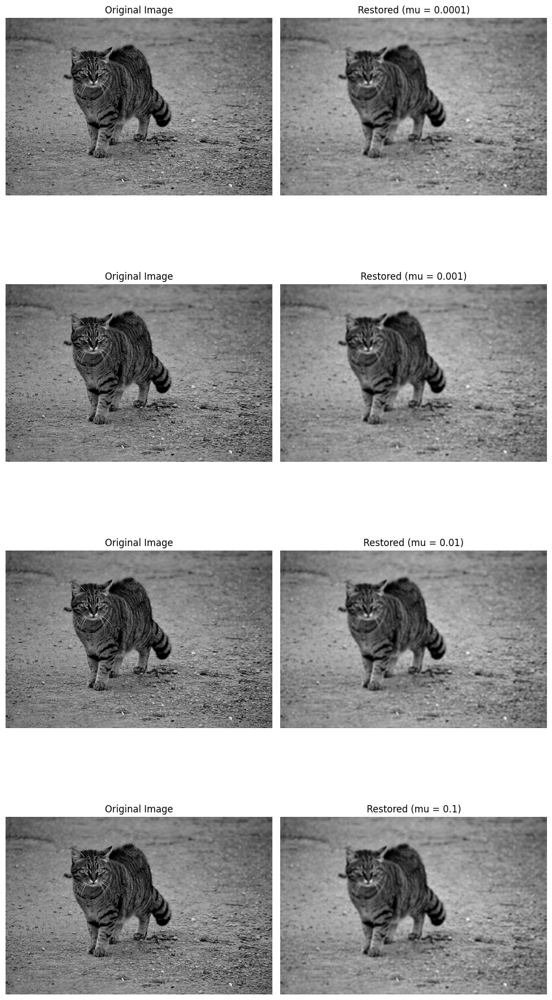

In [14]:
# Define the blur kernel using Gaussian function
kernel = cv2.getGaussianKernel(15, 3)  # Kernel size 15x15 with standard deviation 3
kernel = kernel @ kernel.T  # Convert to 2D Gaussian kernel
mu_values = [0.0001, 0.001, 0.01, 0.1]
restored_images_h1 = {}

# Create a figure and axes for plotting
fig, axes = plt.subplots(len(mu_values), 2, figsize=(10, 5 * len(mu_values)))

# Iterate over mu values and perform deconvolution
for i, mu in enumerate(mu_values):
    # Apply H1 deconvolution
    image_restored_h1 = H1_deconvolution(image_noise, kernel, mu)
    restored_images_h1[mu] = image_restored_h1

    # Display the original and restored images
    axes[i, 0].imshow(image, cmap='gray')
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(image_restored, cmap='gray')
    axes[i, 1].set_title(f"Restored (mu = {mu})")
    axes[i, 1].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


In [15]:
# Calculate PSNR
for mu, restored_image in restored_images_h1.items():
    psnr_value = calculate_psnr(image, restored_image)
    print(f"PSNR for mu={mu}: {psnr_value:.2f} dB")

PSNR for mu=0.0001: 15.39 dB
PSNR for mu=0.001: 20.32 dB
PSNR for mu=0.01: 23.95 dB
PSNR for mu=0.1: 22.26 dB


We obtanined good results, still, we could try adiiferend kind of blurring. In this case we will try to use `Linear Motion Blur`.
It is a kind of blur which arises when a camera detects movement, and it can be horizontal or vertical. here we consider the Horizontal Motion.

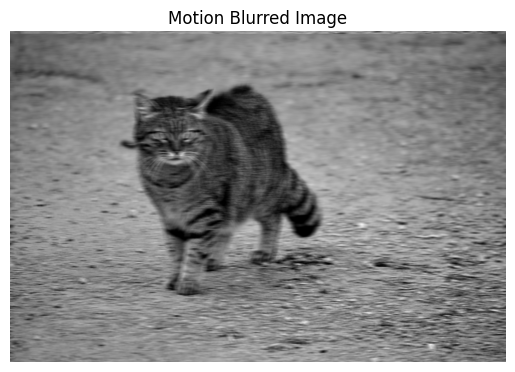

In [17]:
#We define the motion blur kernel and apply it to the image.
def motion_blur(image, kernel_size=15):
    # Horizontal motion blur kernel definition
    kernel = np.zeros((kernel_size, kernel_size))
    kernel[kernel_size // 2, :] = 1  # Set the middle row to 1 (horizontal motion)
    kernel /= kernel_size  # Normalize the kernel

    # Pad the kernel to match the image size
    pad_h = image.shape[0] - kernel.shape[0]
    pad_w = image.shape[1] - kernel.shape[1]
    kernel_padded = np.pad(kernel, [(0, pad_h), (0, pad_w)], mode='constant')

    # Apply the kernel in the frequency domain
    image_fft = np.fft.fft2(image)
    kernel_fft = np.fft.fft2(kernel_padded)
    blurred_fft = image_fft * kernel_fft
    blurred_image = np.fft.ifft2(blurred_fft).real

    # Normalize the blurred image
    blurred_image = np.clip(blurred_image, 0, 1)
    return blurred_image

# Apply motion blur to the image
image_motion_blur = motion_blur(image)

# Display the motion blurred image
plt.imshow(image_motion_blur, cmap='gray')
plt.title('Motion Blurred Image')
plt.axis('off')
plt.show()

We again plot the Fourier Transform. In this case we can observe some vertical lines which represent the concentration of frequency components perpendicular to the direction of blur. This is a consequence of the way motion blur affects the spatial frequencies in the image.

(-0.5, 1199.5, 799.5, -0.5)

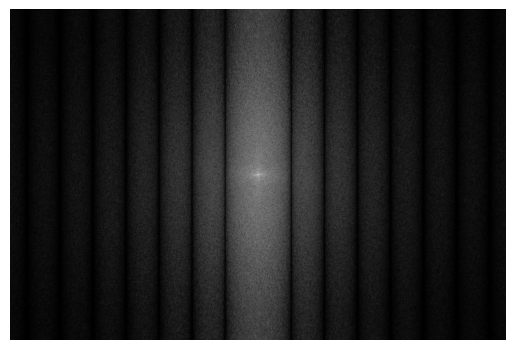

In [20]:
G = np.fft.fft2(image_motion_blur)
G = fftshift(np.abs(G))
plt.imshow(np.log1p(G), cmap='gray')
plt.axis("off")

We add noise and restore the image using same regularization techniques as before.

In [18]:
gaussian_noise = np.random.normal(0, 0.01, image_blur.shape)
image_motion_noise = np.clip(image_blur + gaussian_noise, 0, 1)

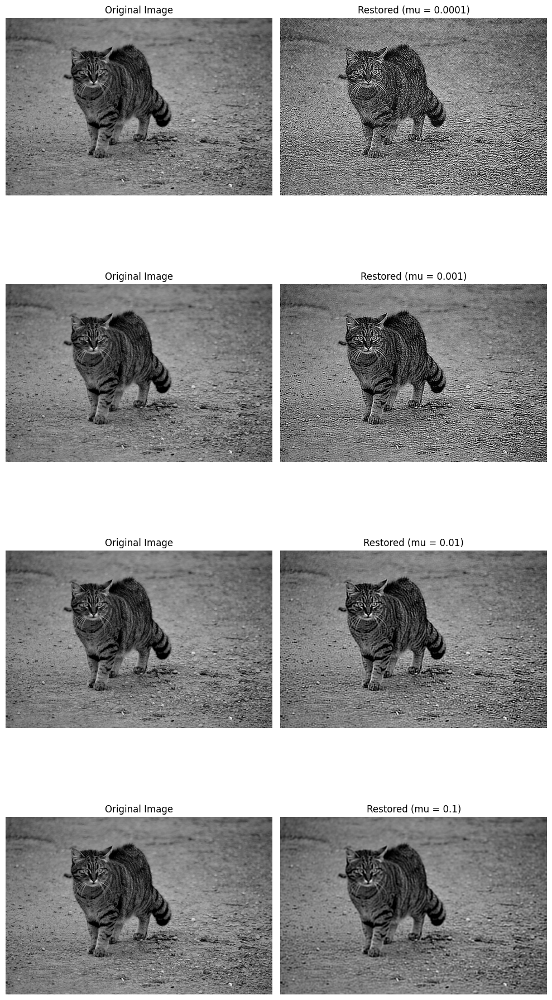

In [22]:
kernel = cv2.getGaussianKernel(15, 3)
kernel = kernel @ kernel.T  # Convert to 2D Gaussian kernel
mu_values = [0.0001, 0.001, 0.01, 0.1]
restored_images_2 = {}

# Create a figure and axes for plotting
fig, axes = plt.subplots(len(mu_values), 2, figsize=(10, 5 * len(mu_values)))

# Iterate over mu values and perform deconvolution
for i, mu in enumerate(mu_values):
    # Apply Wiener deconvolution
    image_restored = L2_deconvolution(image_motion_noise, kernel, mu)
    restored_images_2[mu] = image_restored

    # Display the original and restored images
    axes[i, 0].imshow(image, cmap='gray')
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(image_restored, cmap='gray')
    axes[i, 1].set_title(f"Restored (mu = {mu})")
    axes[i, 1].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

And plot PSNR values

In [23]:
# Calculate PSNR
for mu, restored_image in restored_images_2.items():
    psnr_value = calculate_psnr(image, restored_image)
    print(f"PSNR for mu={mu}: {psnr_value:.2f} dB")

PSNR for mu=0.0001: 13.08 dB
PSNR for mu=0.001: 19.09 dB
PSNR for mu=0.01: 23.73 dB
PSNR for mu=0.1: 22.45 dB


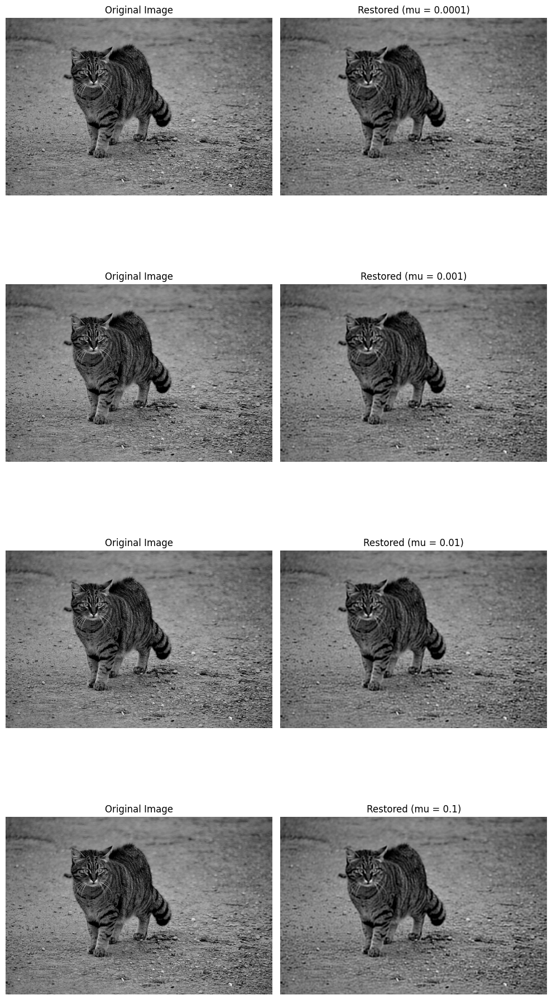

In [24]:
# Define the blur kernel using Gaussian function
kernel = cv2.getGaussianKernel(15, 3)  # Kernel size 15x15 with standard deviation 3
kernel = kernel @ kernel.T  # Convert to 2D Gaussian kernel
mu_values = [0.0001, 0.001, 0.01, 0.1]
restored_images_2h1 = {}

# Create a figure and axes for plotting
fig, axes = plt.subplots(len(mu_values), 2, figsize=(10, 5 * len(mu_values)))

# Iterate over mu values and perform deconvolution
for i, mu in enumerate(mu_values):
    # Apply H1 deconvolution
    image_restored_h1 = H1_deconvolution(image_noise, kernel, mu)
    restored_images_2h1[mu] = image_restored_h1

    # Display the original and restored images
    axes[i, 0].imshow(image, cmap='gray')
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(image_restored, cmap='gray')
    axes[i, 1].set_title(f"Restored (mu = {mu})")
    axes[i, 1].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [25]:
# Calculate PSNR
for mu, restored_image in restored_images_2h1.items():
    psnr_value = calculate_psnr(image, restored_image)
    print(f"PSNR for mu={mu}: {psnr_value:.2f} dB")

PSNR for mu=0.0001: 15.39 dB
PSNR for mu=0.001: 20.32 dB
PSNR for mu=0.01: 23.95 dB
PSNR for mu=0.1: 22.26 dB


Now we can try a different approach, by using what is called a window function, trying to reduce artifacts in the image.
The window is applyed to the image before the convolution:

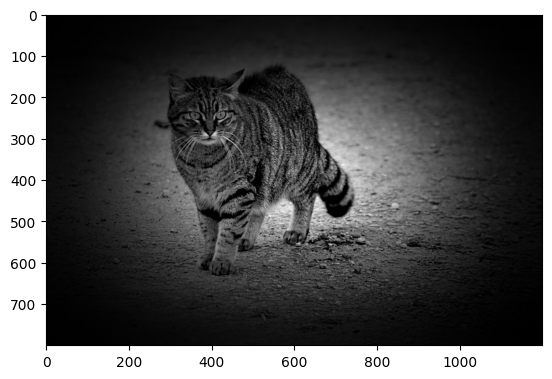

In [26]:
from scipy.signal.windows import triang

#create hamming window
def hamming_window(size):
    """Creates a 2D Hamming window."""
    return np.outer(np.hamming(size[0]), np.hamming(size[1]))

hamm = hamming_window(image.shape)

windowed_image = image * hamm
plt.imshow(windowed_image, cmap='gray')

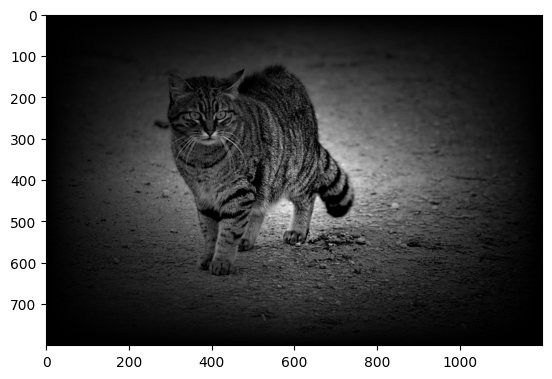

In [27]:
h, w = image.shape

# Create a triangular window
window_x = triang(w)  # 1D triangular window in x-direction
window_y = triang(h)  # 1D triangular window in y-direction
triangular = np.outer(window_y, window_x)  # 2D triangular window

windowed_image_t = image * triangular
plt.imshow(windowed_image_t, cmap='gray')

In [28]:
# Function for simple Wiener deconvolution with windowing
def deconvolution_windowed(blurred, kernel, mu, window):

    # Convert image to float32 for precision
    blurred = np.float32(blurred)

    # Apply windowing to the image
    blurred_windowed = blurred * window

    # Pad kernel to image size
    pad_h, pad_w = h - kernel.shape[0], w - kernel.shape[1]
    kernel_padded = np.pad(kernel, [(0, pad_h), (0, pad_w)], mode='constant')

    # Compute Fourier transforms
    G = np.fft.fft2(blurred_windowed)
    K = np.fft.fft2(kernel_padded)

    # Wiener deconvolution
    K_conj = np.conj(K)  # Compute complex conjugate
    F_hat = (G * K_conj) / (np.abs(K) ** 2 + mu)  # Apply Wiener filter

    # Inverse Fourier transform to get restored image
    restored = np.fft.ifft2(F_hat).real

    # clip to 0-1
    restored = np.clip(restored, 0, 1)

    return restored

In [29]:
def h1_windowed(blurred, kernel, mu, window):

    # Convert image to float32 for precision
    blurred = np.float32(blurred)

    # Apply windowing to the image
    blurred_windowed = blurred * window

    # Pad kernel to the size of the image to avoid boundary issues
    pad_h, pad_w = h - kernel.shape[0], w - kernel.shape[1]
    kernel_padded = np.pad(kernel, [(0, pad_h), (0, pad_w)], mode='constant')

    # Compute Fourier transforms of both the blurred image and the padded kernel
    G = np.fft.fft2(blurred_windowed)
    K = np.fft.fft2(kernel_padded)

    # Compute the gradient penalty term in the Fourier domain
    # The gradient in Fourier domain is a multiplication by frequency components
    freq_x = np.fft.fftfreq(w)
    freq_y = np.fft.fftfreq(h)
    fx, fy = np.meshgrid(freq_x, freq_y)

    # Regularization term (1 + |omega_1|^2 + |omega_2|^2)
    freq_term = (2 * np.pi * fx) ** 2 + (2 * np.pi * fy) ** 2
    regularization_term = mu * (1 + freq_term)

    K_conj = np.conj(K)  # Compute complex conjugate of kernel
    F_hat = (G * K_conj) / (np.abs(K) ** 2 + regularization_term)

    # Inverse Fourier transform to get restored image in the spatial domain
    restored = np.fft.ifft2(F_hat).real

    # clip the result to 0-1
    restored = np.clip(restored, 0, 1)

    return restored

In [30]:
kernel = cv2.getGaussianKernel(15, 3)
kernel = kernel @ kernel.T  # Convert to 2D Gaussian kernel

# Deconvolution parameters
mu = 0.1  # Regularization parameter

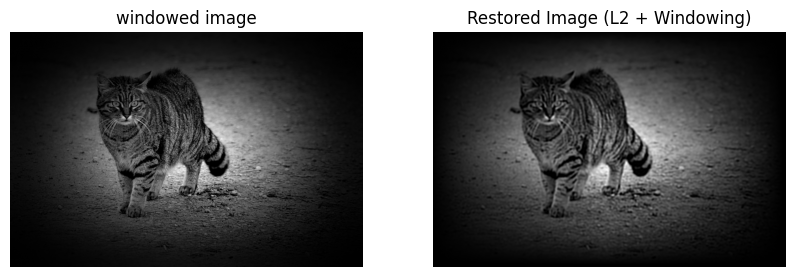

In [35]:
# l2 deconvolution with triangular window
restored_l2_t = deconvolution_windowed(image_noise, kernel, mu, window = triangular)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(windowed_image, cmap='gray')
plt.title("windowed image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(restored_l2_t, cmap='gray')
plt.title("Restored Image (L2 + Windowing)")
plt.axis('off')

plt.show()

In [36]:
# Calculate PSNR
psnr_value = calculate_psnr(windowed_image, restored_l2_t)

print(f"PSNR: {psnr_value:.2f} dB")

PSNR: 26.01 dB


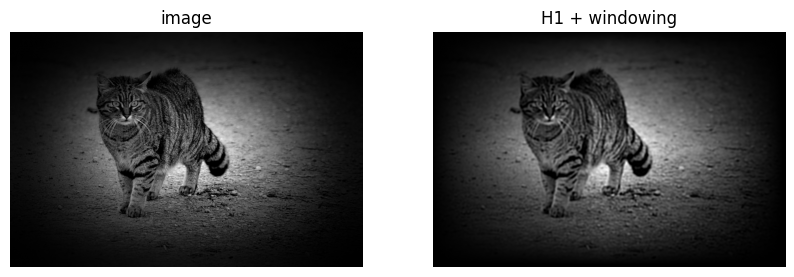

In [37]:
#h1 deconvolution with triangular window
restored_h1_t = h1_windowed(image_noise, kernel, mu, window = triangular)

# Show the results
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("image")
plt.imshow(windowed_image, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("H1 + windowing")
plt.imshow(restored_h1_t, cmap='gray')
plt.axis('off')
plt.show()

In [38]:
# Calculate PSNR
psnr_value = calculate_psnr(windowed_image, restored_h1_t)

print(f"PSNR: {psnr_value:.2f} dB")

PSNR: 25.93 dB


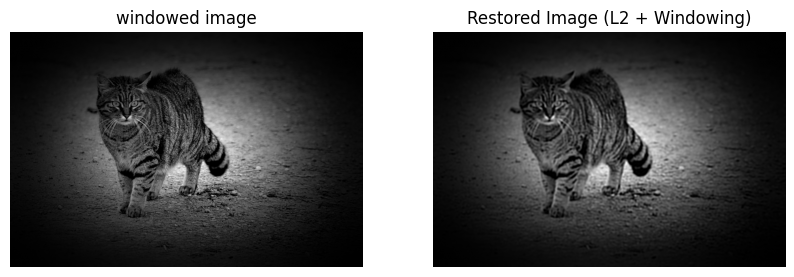

In [31]:
#l2 deconvolution with hamming window
restored_l2_hamm = deconvolution_windowed(image_noise, kernel, mu, window = hamm)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(windowed_image, cmap='gray')
plt.title("windowed image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(restored_l2_hamm, cmap='gray')
plt.title("Restored Image (L2 + Windowing)")
plt.axis('off')

plt.show()

In [32]:
# Calculate PSNR
psnr_value = calculate_psnr(windowed_image, restored_l2_hamm)

print(f"PSNR: {psnr_value:.2f} dB")

PSNR: 30.40 dB


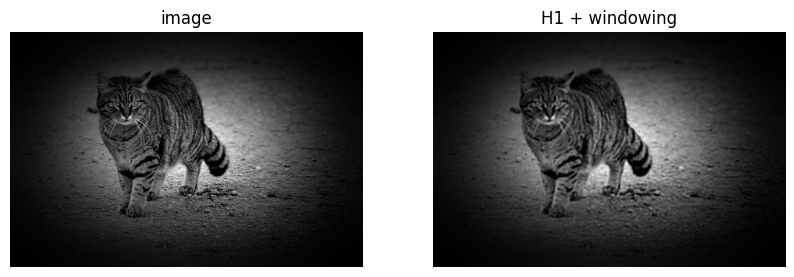

In [33]:
#h1 deconvolution with hamming window
restored_h1_hamm = h1_windowed(image_noise, kernel, mu, window = hamm)

# Show the results
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("image")
plt.imshow(windowed_image, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("H1 + windowing")
plt.imshow(restored_h1_hamm, cmap='gray')
plt.axis('off')
plt.show()

In [34]:
# Calculate PSNR
psnr_value = calculate_psnr(windowed_image, restored_h1_hamm)

print(f"PSNR: {psnr_value:.2f} dB")

PSNR: 30.22 dB
